In [95]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os
import warnings
import folium
from folium.plugins import MarkerCluster

In [2]:
train=pd.read_csv('data (1).csv')
train.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,to_date,online_booking,mobile_site_booking,booking_created,from_lat,from_long,to_lat,to_long,Car_Cancellation
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,1/1/2013 2:00,NaN,0,0,1/1/2013 1:39,12.924150,77.672290,12.927320,77.635750,0
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,1/1/2013 9:00,NaN,0,0,1/1/2013 2:25,12.966910,77.749350,12.927680,77.626640,0
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,1/1/2013 3:30,NaN,0,0,1/1/2013 3:08,12.937222,77.626915,13.047926,77.597766,0
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,1/1/2013 5:45,NaN,0,0,1/1/2013 4:39,12.989990,77.553320,12.971430,77.639140,0
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,1/1/2013 9:00,NaN,0,0,1/1/2013 7:53,12.845653,77.677925,12.954340,77.600720,0


In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43431 entries, 0 to 43430
Data columns (total 19 columns):
id                     43431 non-null int64
user_id                43431 non-null int64
vehicle_model_id       43431 non-null int64
package_id             7550 non-null float64
travel_type_id         43431 non-null int64
from_area_id           43343 non-null float64
to_area_id             34293 non-null float64
from_city_id           16345 non-null float64
to_city_id             1588 non-null float64
from_date              43431 non-null object
to_date                25541 non-null object
online_booking         43431 non-null int64
mobile_site_booking    43431 non-null int64
booking_created        43431 non-null object
from_lat               43338 non-null float64
from_long              43338 non-null float64
to_lat                 34293 non-null float64
to_long                34293 non-null float64
Car_Cancellation       43431 non-null int64
dtypes: float64(9), int64(7), object

In [4]:
train.isnull().sum()

id                         0
user_id                    0
vehicle_model_id           0
package_id             35881
travel_type_id             0
from_area_id              88
to_area_id              9138
from_city_id           27086
to_city_id             41843
from_date                  0
to_date                17890
online_booking             0
mobile_site_booking        0
booking_created            0
from_lat                  93
from_long                 93
to_lat                  9138
to_long                 9138
Car_Cancellation           0
dtype: int64

In [5]:
train.describe()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,online_booking,mobile_site_booking,from_lat,from_long,to_lat,to_long,Car_Cancellation
count,43431.000000,43431.000000,43431.00000,7550.000000,43431.000000,43343.000000,34293.000000,16345.000000,1588.000000,43431.000000,43431.000000,43338.000000,43338.000000,34293.000000,34293.000000,43431.000000
mean,159206.473556,30739.198153,25.71723,2.030066,2.137252,714.544494,669.490917,14.915081,68.537783,0.351592,0.043241,12.982461,77.636255,13.026648,77.640595,0.072114
std,15442.386279,10996.476709,26.79825,1.461756,0.437712,419.883553,400.638225,1.165306,49.880732,0.477473,0.203402,0.085933,0.059391,0.113487,0.064045,0.258680
min,132512.000000,16.000000,1.00000,1.000000,1.000000,2.000000,2.000000,1.000000,4.000000,0.000000,0.000000,12.776630,77.386930,12.776630,77.386930,0.000000
25%,145778.000000,24614.000000,12.00000,1.000000,2.000000,393.000000,393.000000,15.000000,32.000000,0.000000,0.000000,12.926450,77.593661,12.951850,77.582030,0.000000
50%,159248.000000,31627.000000,12.00000,2.000000,2.000000,590.000000,541.000000,15.000000,49.000000,0.000000,0.000000,12.968887,77.635750,12.982750,77.645030,0.000000
75%,172578.500000,39167.000000,24.00000,2.000000,2.000000,1089.000000,1054.000000,15.000000,108.000000,1.000000,0.000000,13.007750,77.688900,13.199560,77.706880,0.000000
max,185941.000000,48730.000000,91.00000,7.000000,3.000000,1403.000000,1403.000000,31.000000,203.000000,1.000000,1.000000,13.366072,77.786420,13.366072,77.786420,1.000000


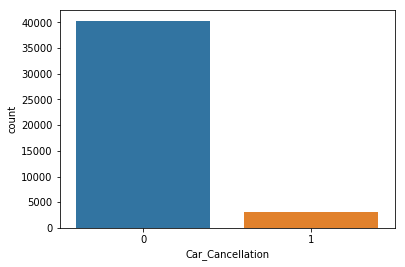

In [6]:
sns.countplot(train['Car_Cancellation'])

In [7]:
p1=train.groupby('online_booking')['Car_Cancellation'].sum().reset_index()
p1

,online_booking,Car_Cancellation
0,0,1229
1,1,1903


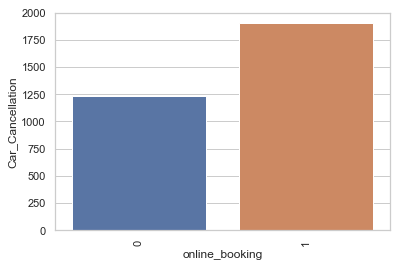

In [8]:
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'online_booking', y = 'Car_Cancellation', data=p1)
plt.xticks(rotation = 90)
plt.show()

In [9]:
p2=train.groupby('mobile_site_booking')['Car_Cancellation'].sum().reset_index()
p2

,mobile_site_booking,Car_Cancellation
0,0,2843
1,1,289


## Bookings made by mobile have very rare chance of cancellation.

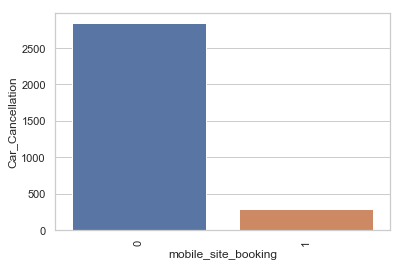

In [10]:
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'mobile_site_booking', y = 'Car_Cancellation', data=p2)
plt.xticks(rotation = 90)
plt.show()

Text(0,0.5,'Latitude')

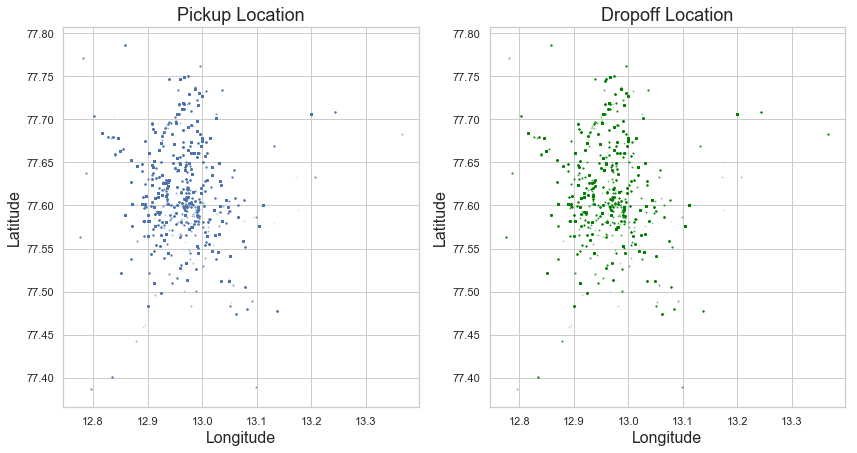

In [11]:

fig = plt.figure(figsize=(14,7))

ax1 = fig.add_subplot(121)
ax1.scatter(train.from_lat,train.from_long,s=1,alpha=0.1)

plt.xlabel('Longitude',fontsize=16)
plt.ylabel('Latitude',fontsize=16)
plt.title('Pickup Location',fontsize=18)

ax2 = fig.add_subplot(122)
ax2.scatter(train.to_lat,train.to_long,s=1,color='green',alpha=0.1)

plt.title('Dropoff Location',fontsize=18)
plt.xlabel('Longitude',fontsize=16)
plt.ylabel('Latitude',fontsize=16)

In [12]:
# convert from_date,to_date,booking_created column to date-time
# Note: when we try to convert NaN to date-time, it gets converted to NaT( Not a timestamp )
train['Datetime'] = pd.to_datetime(train.from_date,format='%m/%d/%Y %H:%M')
train['to_date'] = pd.to_datetime(train['to_date'])
train['booking_created'] = pd.to_datetime(train['booking_created'])

In [13]:
train['year'] = train.Datetime.dt.year
train['month'] = train.Datetime.dt.month
train['day'] = train.Datetime.dt.day
train['hour'] = train.Datetime.dt.hour
train['day_of_week']=train.Datetime.dt.dayofweek

In [14]:
train.head()

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,from_long,to_lat,to_long,Car_Cancellation,Datetime,year,month,day,hour,day_of_week
0,132512,22177,28,NaN,2,83.0,448.0,NaN,NaN,1/1/2013 2:00,...,77.672290,12.927320,77.635750,0,2013-01-01 02:00:00,2013,1,1,2,1
1,132513,21413,12,NaN,2,1010.0,540.0,NaN,NaN,1/1/2013 9:00,...,77.749350,12.927680,77.626640,0,2013-01-01 09:00:00,2013,1,1,9,1
2,132514,22178,12,NaN,2,1301.0,1034.0,NaN,NaN,1/1/2013 3:30,...,77.626915,13.047926,77.597766,0,2013-01-01 03:30:00,2013,1,1,3,1
3,132515,13034,12,NaN,2,768.0,398.0,NaN,NaN,1/1/2013 5:45,...,77.553320,12.971430,77.639140,0,2013-01-01 05:45:00,2013,1,1,5,1
4,132517,22180,12,NaN,2,1365.0,849.0,NaN,NaN,1/1/2013 9:00,...,77.677925,12.954340,77.600720,0,2013-01-01 09:00:00,2013,1,1,9,1


In [15]:
max_vol3 = train.groupby('year')['Car_Cancellation'].sum().reset_index()

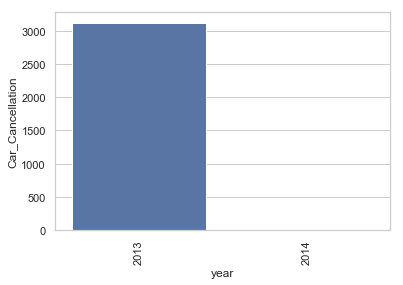

In [16]:
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'year', y = 'Car_Cancellation', data=max_vol3)
plt.xticks(rotation = 90)
plt.show()

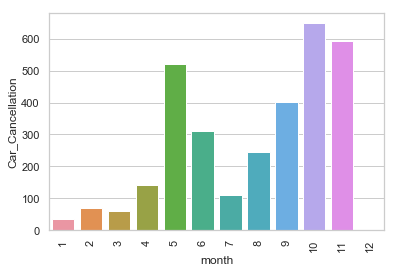

In [17]:
max_vol4 = train.groupby('month')['Car_Cancellation'].sum().reset_index()
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'month', y = 'Car_Cancellation', data=max_vol4)
plt.xticks(rotation = 90)
plt.show()

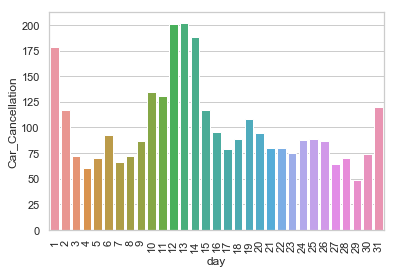

In [18]:
max_vol5 = train.groupby('day')['Car_Cancellation'].sum().reset_index()
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'day', y = 'Car_Cancellation', data=max_vol5)
plt.xticks(rotation = 90)
plt.show()

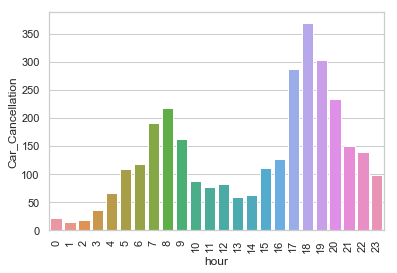

In [19]:
max_vol6 = train.groupby('hour')['Car_Cancellation'].sum().reset_index()
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'hour', y = 'Car_Cancellation', data=max_vol6)
plt.xticks(rotation = 90)
plt.show()

 ### OBSERVATION: Number of cancel trips is maximum in the evening due to office hours rush.

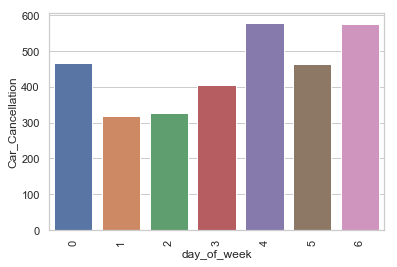

In [20]:
max_vol7 = train.groupby('day_of_week')['Car_Cancellation'].sum().reset_index()
sns.set(style="whitegrid", color_codes=True)
sns.barplot(x = 'day_of_week', y = 'Car_Cancellation', data=max_vol7)
plt.xticks(rotation = 90)
plt.show()

[Text(0.5,87.3331,'Correlation map')]

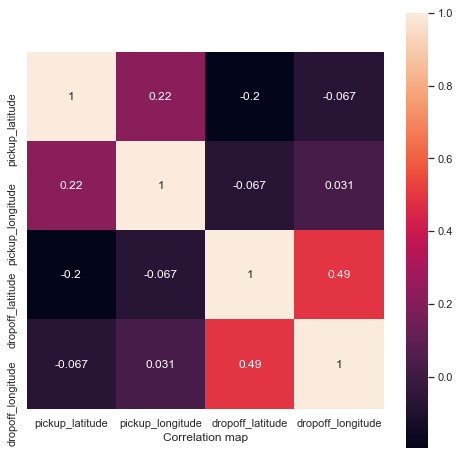

In [21]:
loc_frame = pd.DataFrame()
loc_frame['pickup_latitude'] = train['from_lat']
loc_frame['pickup_longitude'] = train['from_long']
loc_frame['dropoff_latitude'] = train['to_lat']
loc_frame['dropoff_longitude'] = train['to_long']

corr = loc_frame.corr()
plt.figure(figsize=(8,8))
ax = sns.heatmap(corr,vmax=1,square=True,annot=True)
ax.set(xlabel='Correlation map')

In [22]:
days={0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}
train['name_day'] = train['day_of_week'].map(days)
train[['day_of_week','name_day']].tail(10)

,day_of_week,name_day
43421,0,Monday
43422,6,Sunday
43423,6,Sunday
43424,6,Sunday
43425,0,Monday
43426,6,Sunday
43427,1,Tuesday
43428,6,Sunday
43429,6,Sunday
43430,0,Monday


## Analsying Days Wise

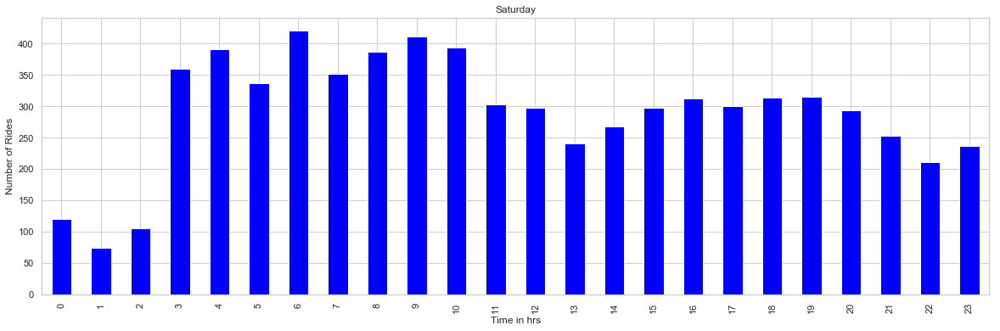

In [23]:
## Lets analysis for each day to find the peak time of each day
day_saturday=train[train['name_day']=='Saturday']
day_saturday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='blue')
plt.title('Saturday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

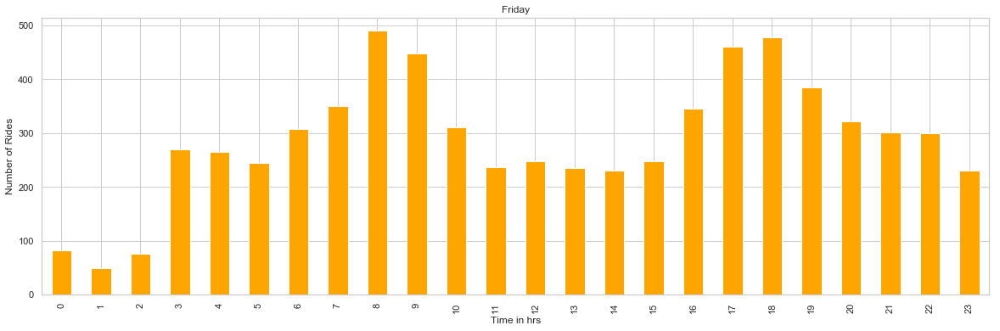

In [24]:
day_friday=train[train['name_day']=='Friday']
day_friday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='orange')
plt.title('Friday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

### On Friday the peak time usually 8:00- 9:00 and 17:00 - 19: 00.

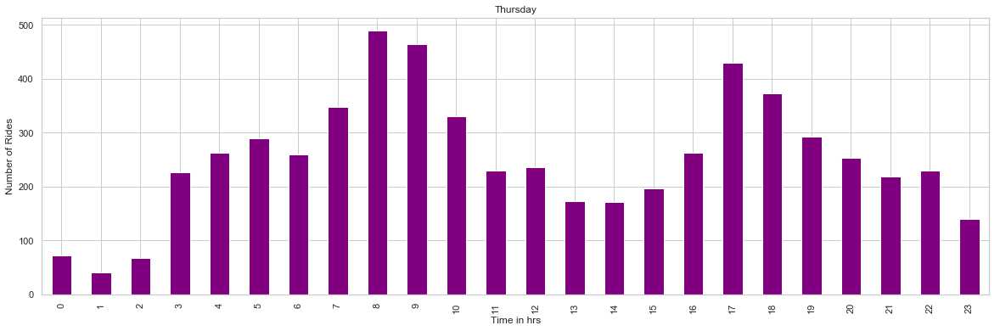

In [25]:
day_thursday=train[train['name_day']=='Thursday']
day_thursday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='purple')
plt.title('Thursday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

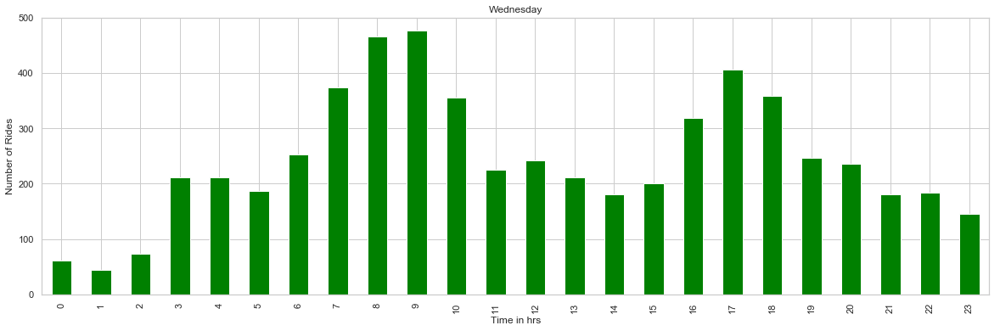

In [26]:
day_wednesday=train[train['name_day']=='Wednesday']
day_wednesday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='green')
plt.title('Wednesday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

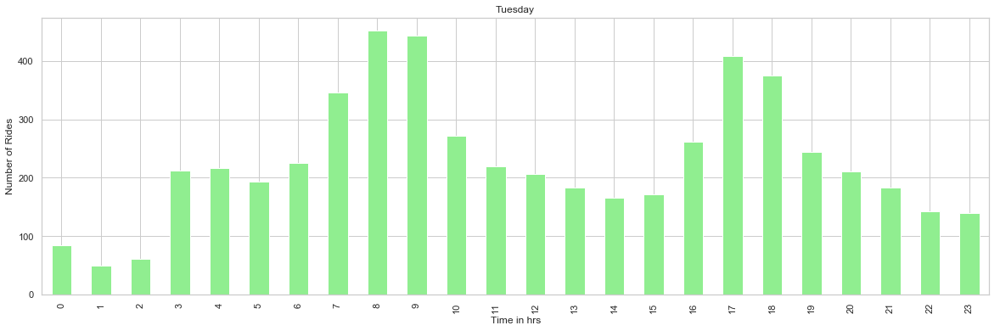

In [27]:
day_tuesday=train[train['name_day']=='Tuesday']
day_tuesday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='Lightgreen')
plt.title('Tuesday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

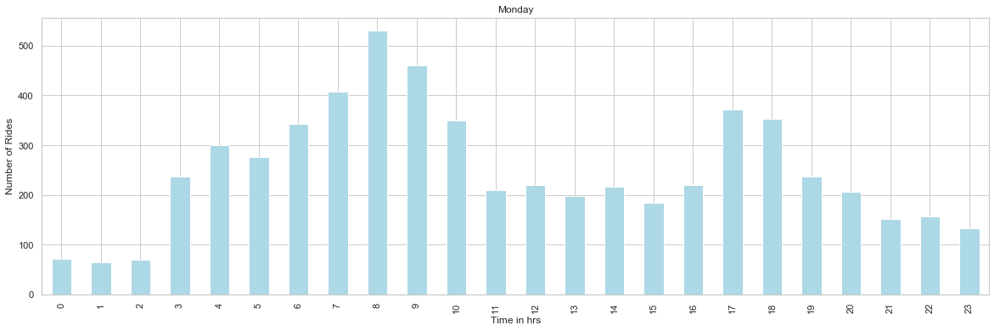

In [28]:
day_monday=train[train['name_day']=='Monday']
day_monday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='Lightblue')
plt.title('Monday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

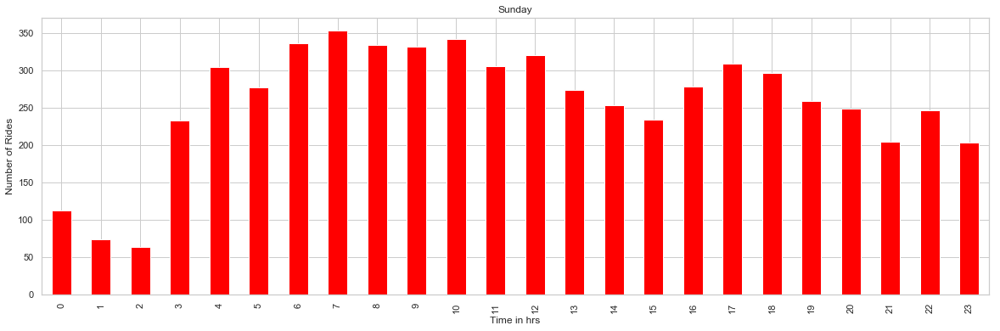

In [29]:
day_sunday=train[train['name_day']=='Sunday']
day_sunday['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='red')
plt.title('Sunday')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

### We analysed following points while plotting day wise-

### 1.On Sunday and Saturday there is rush almost every time due to weekend.

### 2.Monday to Friday follow same pattern having  peak time usually betweem  8:00- 9:00 and 17:00 - 19: 00 at office reaching and leaving peak time.

In [30]:
p3=pd.crosstab(train.vehicle_model_id,train.Car_Cancellation)
p3

Car_Cancellation,0,1
vehicle_model_id,,
1,2,0
10,104,0
12,29191,2668
13,6,1
14,1,0
17,40,0
23,297,0
24,1491,3
28,1626,76


## We can observe that when vehicle_model_id is 12 the number of bookings is very high compared to other ids.

In [31]:
p3['cancel_percent']=(p3[1]/(p3[1]+p3[0]))*100
p3.cancel_percent.sort_values(ascending=False)

vehicle_model_id
13    14.285714
89    12.463404
12     8.374400
91     8.000000
28     4.465335
65     3.085774
87     2.831858
85     0.373909
24     0.200803
36     0.000000
10     0.000000
14     0.000000
17     0.000000
23     0.000000
30     0.000000
54     0.000000
39     0.000000
43     0.000000
90     0.000000
64     0.000000
69     0.000000
70     0.000000
72     0.000000
75     0.000000
76     0.000000
86     0.000000
1      0.000000
Name: cancel_percent, dtype: float64

### We can observe that when vehicle_model_id is 13 the number of cancelled booking is very high compared to other ids.

In [32]:
train.package_id.value_counts()

1.0    3503
2.0    2651
6.0     502
4.0     412
3.0     375
7.0     101
5.0       6
Name: package_id, dtype: int64

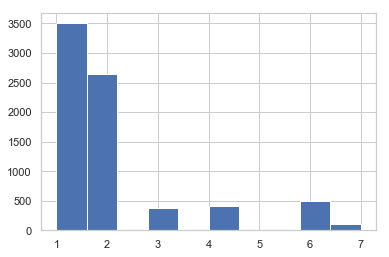

In [33]:
train.package_id.hist()

### Most of the packages that people opt for are for a journey of 4hrs and around 40kms, followed by 8hrs and 80kms.

In [34]:
p4=pd.crosstab(train.package_id,train.Car_Cancellation)
p4

Car_Cancellation,0,1
package_id,,
1.0,3341,162
2.0,2583,68
3.0,348,27
4.0,405,7
5.0,6,0
6.0,436,66
7.0,95,6


In [35]:
p4['cancel_percent']=(p4[1]/(p4[1]+p4[0]))*100
p4.cancel_percent.sort_values(ascending=False)

package_id
6.0    13.147410
3.0     7.200000
7.0     5.940594
1.0     4.624607
2.0     2.565070
4.0     1.699029
5.0     0.000000
Name: cancel_percent, dtype: float64

### When the package is of (3 hours & 30kms) the probability of cancelling the ride is high which is usual as this is the shortest time ride.

In [36]:
train.travel_type_id.value_counts()

2    34292
3     7550
1     1589
Name: travel_type_id, dtype: int64

array([<matplotlib.axes._subplots.AxesSubplot object at 0x11d6e3400>,
      dtype=object)

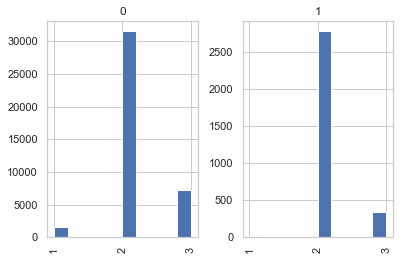

In [37]:
train.hist(column='travel_type_id', by='Car_Cancellation')

### Not surprisingly, most people rent car from point to point travel and around ( 1 / 10 )th of these bookings get cancelled.

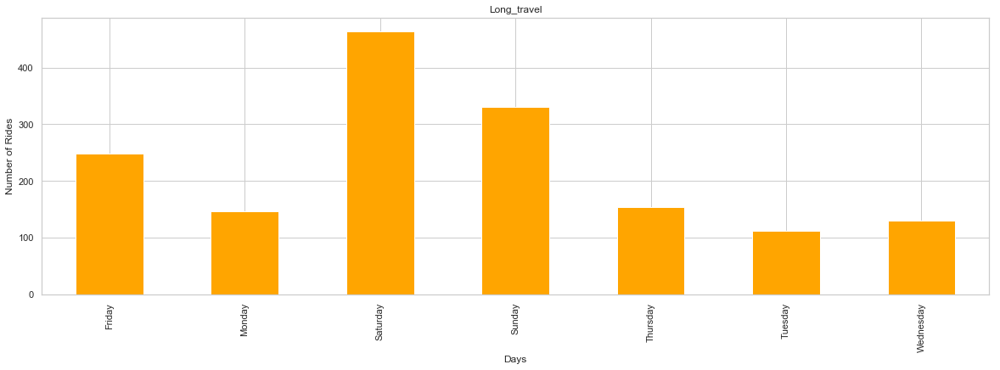

In [38]:
long_distance=train[train['travel_type_id']==1]
long_distance['name_day'].value_counts().sort_index().plot.bar(figsize = (20,6), color='orange')
plt.title('Long_travel')
plt.xlabel("Days")
plt.ylabel("Number of Rides")
plt.show()

###  Long Distance Travel are mostly done on weekends or on Friday Nights.
#### So pricing of cab for long distance should increase on weekends to meet the demand of customers. 

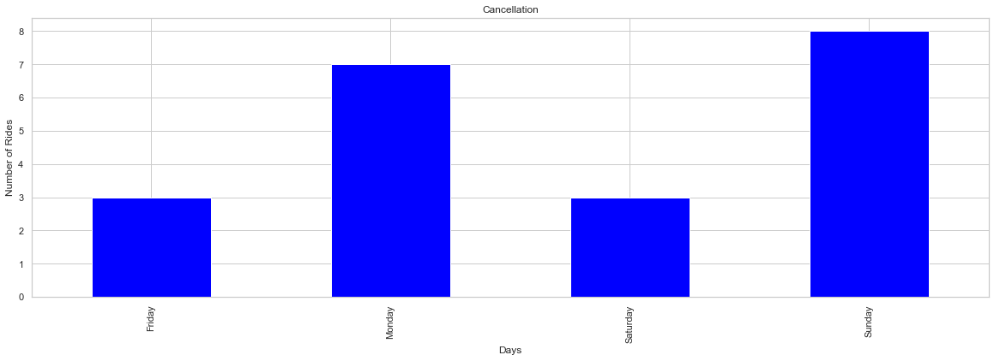

In [39]:
long_distance[long_distance['Car_Cancellation']==1]['name_day'].value_counts().sort_index().plot.bar(figsize = (20,6), color='blue')
plt.title('Cancellation')
plt.xlabel("Days")
plt.ylabel("Number of Rides")
plt.show()

### Most of Cancelleation of Ride is done  on Monday and Sunday

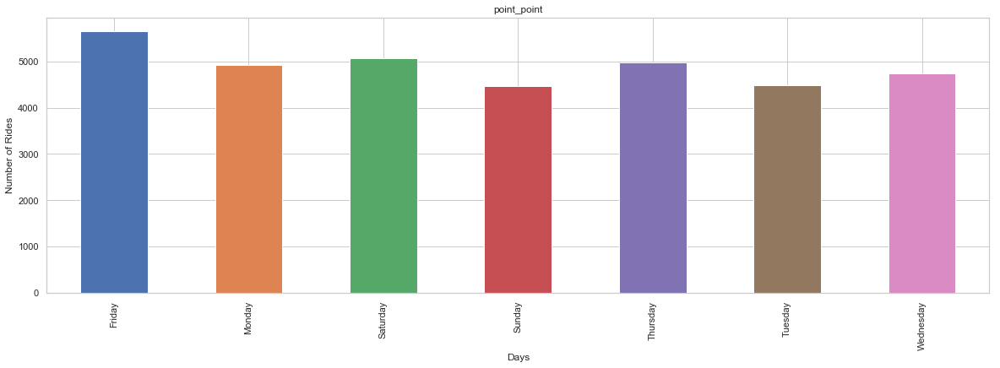

In [40]:
p_p=train[train['travel_type_id']==2]
p_p['name_day'].value_counts().sort_index().plot.bar(figsize = (20,6))
plt.title('point_point')
plt.xlabel("Days")
plt.ylabel("Number of Rides")
plt.show()

### Point to Point travel is genrally used by office people in weekdays

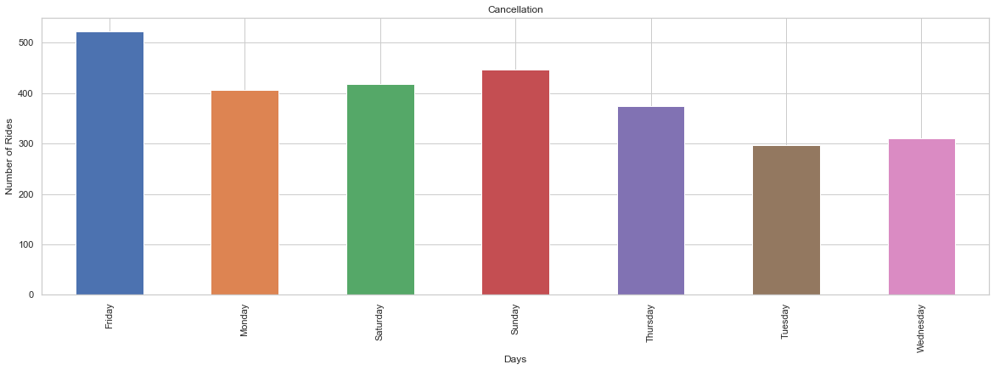

In [41]:
p_p[p_p['Car_Cancellation']==1]['name_day'].value_counts().sort_index().plot.bar(figsize = (20,6))
plt.title('Cancellation')
plt.xlabel("Days")
plt.ylabel("Number of Rides")
plt.show()

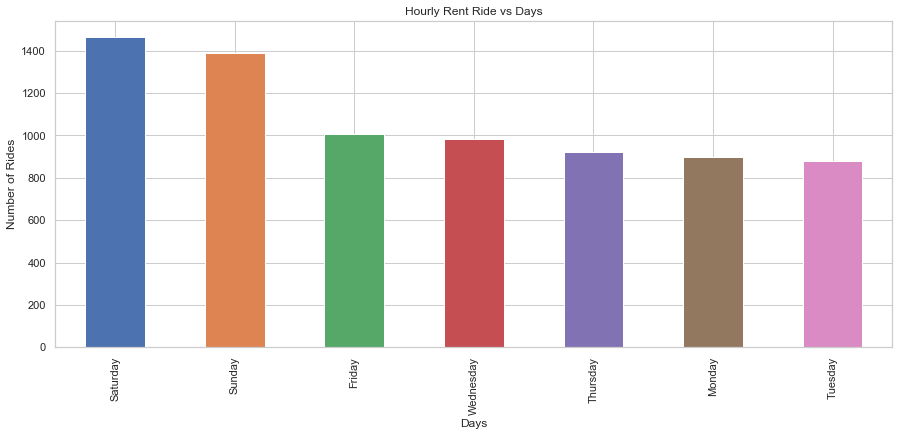

In [42]:
hourly_rent=train[train['travel_type_id']==3]
hourly_rent['name_day'].value_counts().plot.bar(figsize=(15,6))
plt.title("Hourly Rent Ride vs Days")
plt.xlabel("Days")
plt.ylabel("Number of Rides")
plt.show()

### Hourly Rent travel is mostly used during weekend which is so obvious.

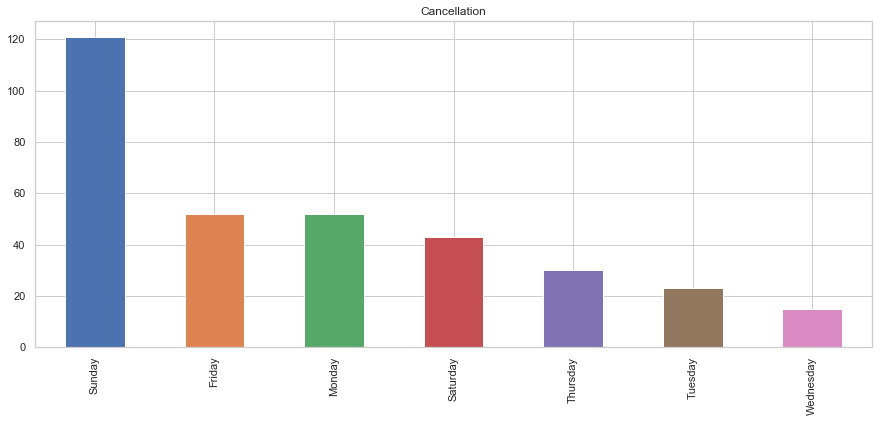

In [43]:
hourly_rent[hourly_rent['Car_Cancellation']==1]['name_day'].value_counts().plot.bar(figsize=(15,6))
plt.title("Cancellation")
plt.show()

### Most cancellations are done on sunday.

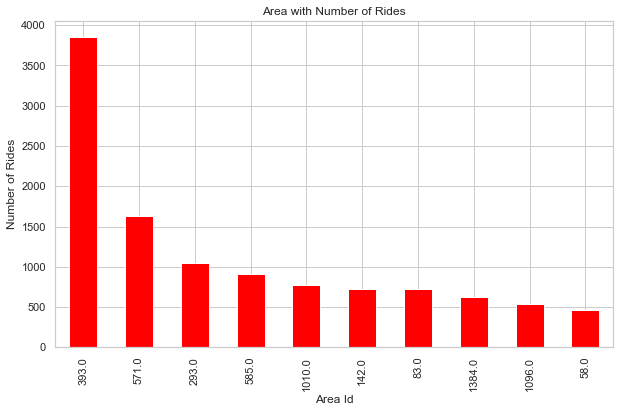

In [44]:
p4=train['from_area_id'].value_counts().head(10)
p4.plot.bar(figsize=(10,6),color='red')
plt.title('Area with Number of Rides')
plt.xlabel("Area Id")
plt.ylabel('Number of Rides')
plt.show()

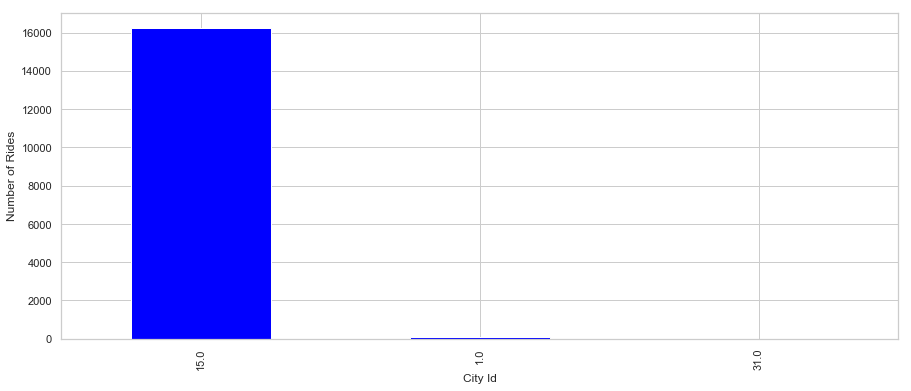

In [45]:
train['from_city_id'].value_counts().plot.bar(x='City id', y='Number of Rides',figsize = (15,6), color='blue')
plt.xlabel("City Id")
plt.ylabel('Number of Rides')
plt.show()

In [46]:
city=train[train['from_city_id']==15]
city['Car_Cancellation'].value_counts()

0    14542
1     1691
Name: Car_Cancellation, dtype: int64

### City id 15 has the most rides  and most rides are successfull.

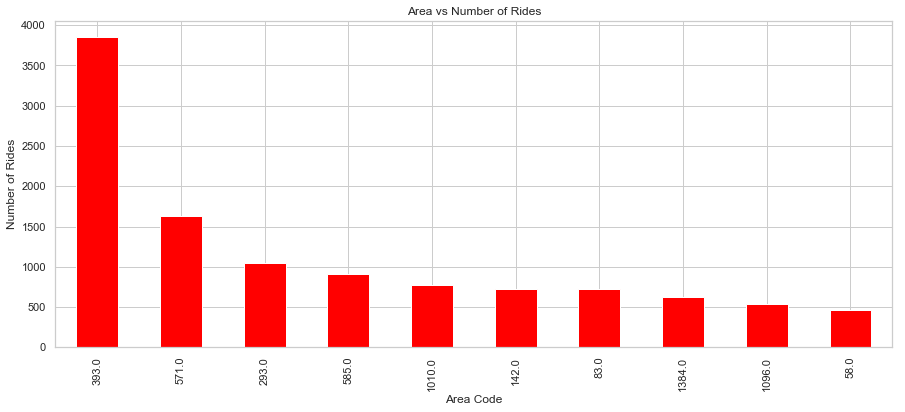

In [71]:
train['from_area_id'].value_counts().head(10).plot.bar(figsize = (15,6), color='red')
plt.xlabel("Area Code")
plt.ylabel('Number of Rides')
plt.title("Area vs Number of Rides")
plt.show()

### Area id 393 has most bookings.



## Visualise Area id 393 day wise

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


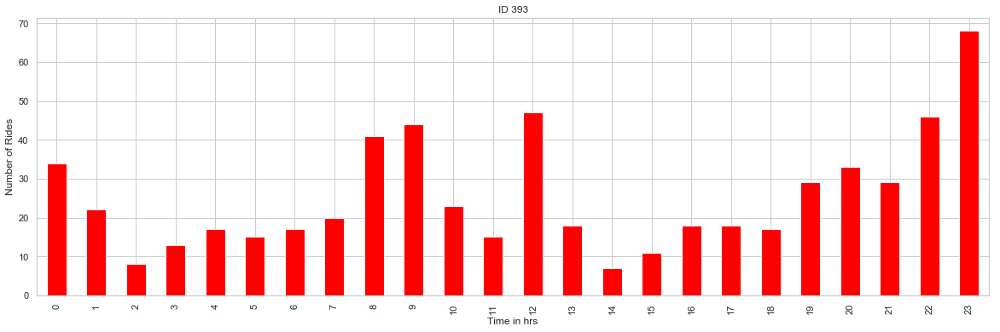

In [83]:
area_id=train[train['from_area_id']==393][train['name_day']=='Monday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='red')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


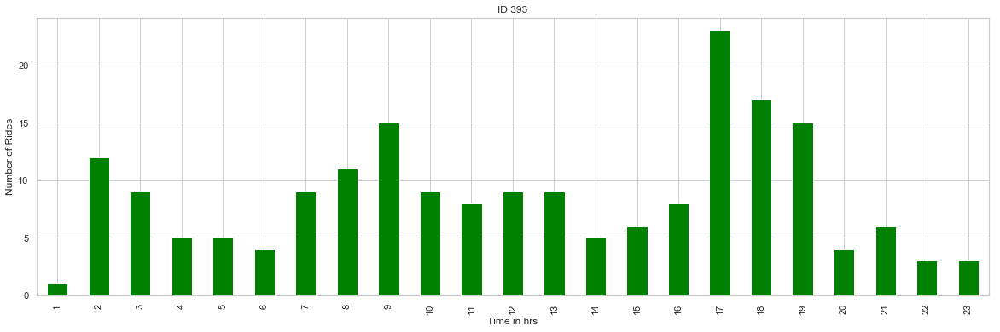

In [90]:
area_id=train[train['from_area_id']==571][train['name_day']=='Tuesday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='green')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


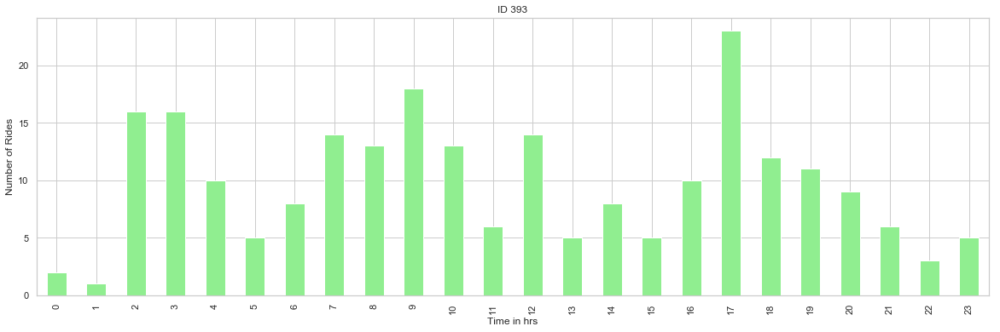

In [89]:
area_id=train[train['from_area_id']==571][train['name_day']=='Wednesday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='lightgreen')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


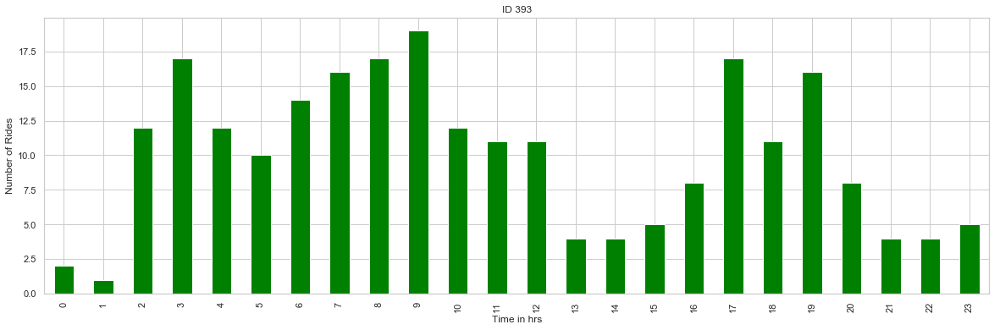

In [91]:
area_id=train[train['from_area_id']==571][train['name_day']=='Thursday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='green')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


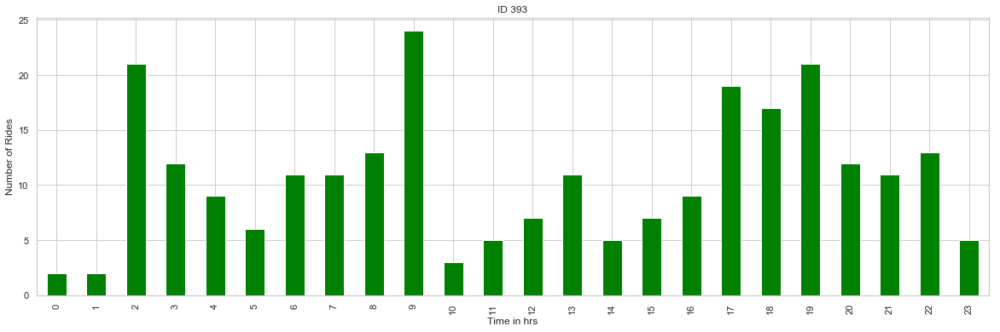

In [92]:
area_id=train[train['from_area_id']==571][train['name_day']=='Friday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='green')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


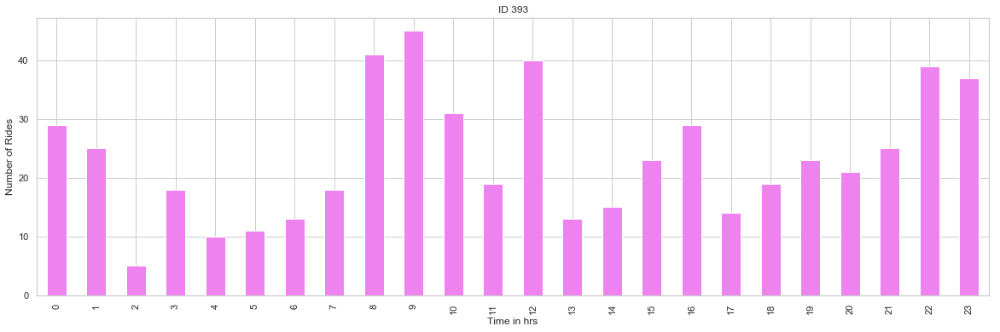

In [86]:
area_id=train[train['from_area_id']==393][train['name_day']=='Saturday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='violet')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


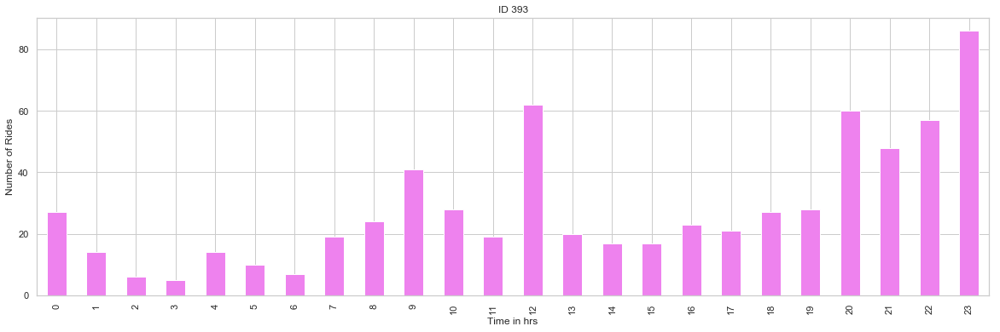

In [88]:
area_id=train[train['from_area_id']==393][train['name_day']=='Sunday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='violet')
plt.title('ID 393')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

### Area Id with maximum cancellations

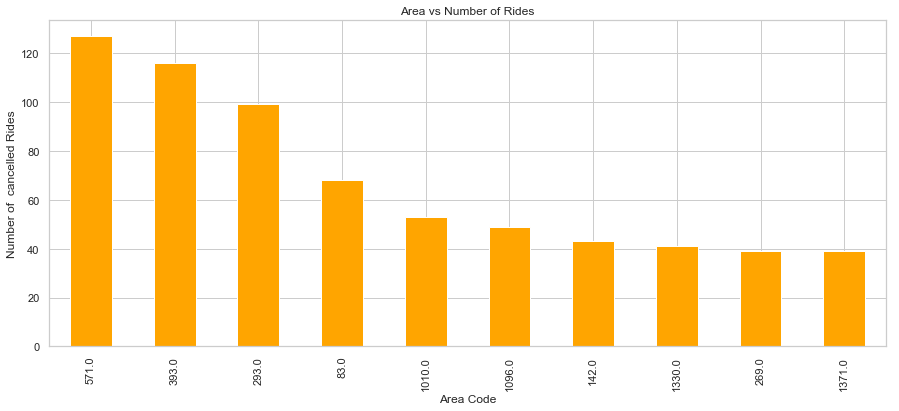

In [73]:
train[train['Car_Cancellation']==1]['from_area_id'].value_counts().head(10).plot.bar(figsize = (15,6), color='orange')
plt.xlabel("Area Code")
plt.ylabel('Number of  cancelled Rides')
plt.title("Area vs Number of Rides")
plt.show()

### Visualise Area Id 571 

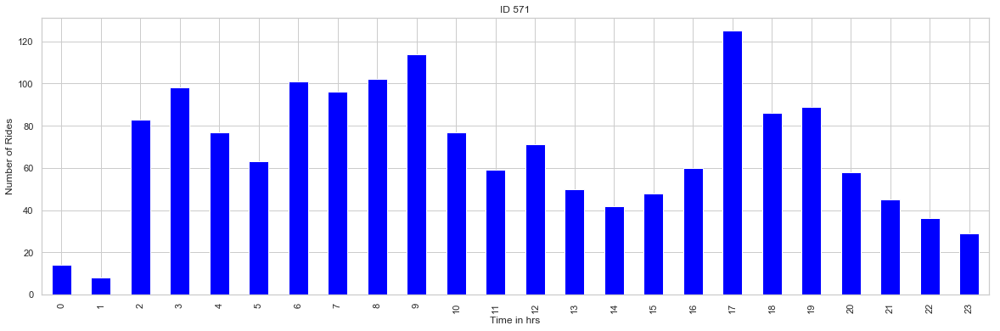

In [68]:
area_id=train[train['from_area_id']==571]
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='blue')
plt.title('ID 571')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


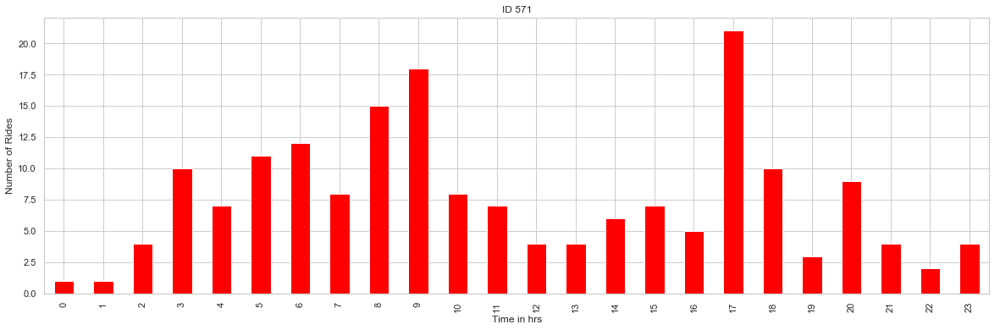

In [77]:
area_id=train[train['from_area_id']==571][train['name_day']=='Monday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='red')
plt.title('ID 571')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


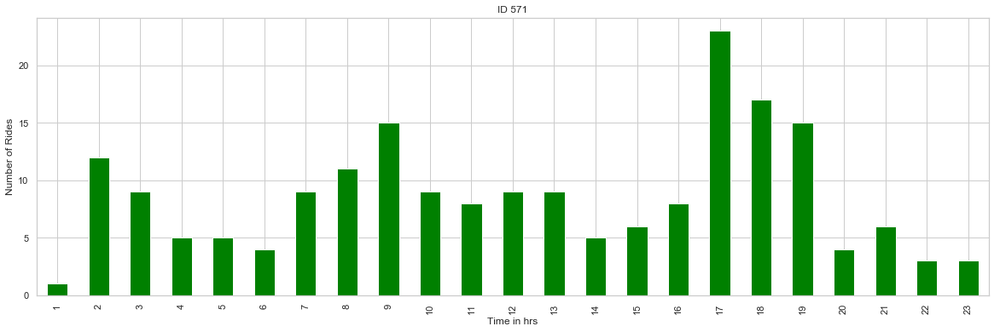

In [79]:
area_id=train[train['from_area_id']==571][train['name_day']=='Tuesday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='green')
plt.title('ID 571')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


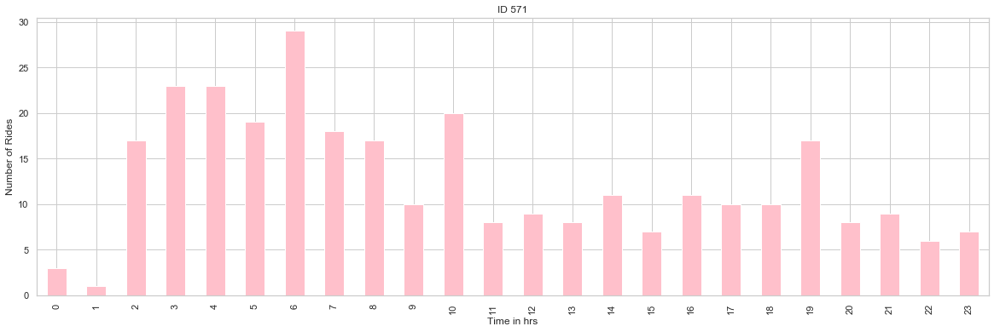

In [80]:
area_id=train[train['from_area_id']==571][train['name_day']=='Saturday']
area_id['hour'].value_counts().sort_index().plot.bar(figsize = (20,6), color='pink')
plt.title('ID 571')
plt.xlabel("Time in hrs")
plt.ylabel("Number of Rides")
plt.show()

## Inferences from area id 571-

1.It has maximum car booking cancellations.

2.On monday and tuesday most bookings are cancelled at office peak hours at 17:00-18:00.

3.On Saturday i.e.weekend most bookings are cancelled at early morning may be beacuse of planning to go out and then cancelling it.


### In the following maps, the numbers on the markers show the number of pickups in that area

In [100]:
mon = pd.DataFrame
mon = train[train.name_day  == "Monday"]
mon_loc = mon.dropna(subset=['from_lat', 'from_long'])

mon_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(mon_map)

for index, rows in mon_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

mon_map

In [113]:
tues = pd.DataFrame
tues = train[train.name_day  == "Tuesday"]
tues_loc = tues.dropna(subset=['from_lat', 'from_long'])

tues_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(tues_map)

for index, rows in tues_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

tues_map

In [107]:
wed = pd.DataFrame
wed = train[train.name_day  == "Wednesday"]
wed_loc = wed.dropna(subset=['from_lat', 'from_long'])

wed_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(wed_map)

for index, rows in wed_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

wed_map

In [108]:
thurs = pd.DataFrame
thurs = train[train.name_day  == "Thursday"]
thurs_loc = thurs.dropna(subset=['from_lat', 'from_long'])

thurs_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(thurs_map)

for index, rows in thurs_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

thurs_map

In [105]:
sat = pd.DataFrame
sat = train[train.name_day  == "Saturday"]
sat

,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,to_lat,to_long,Car_Cancellation,Datetime,year,month,day,hour,day_of_week,name_day
17,132531,22189,24,NaN,1,1383.0,NaN,NaN,32.0,1/12/2013 8:00,...,NaN,NaN,0,2013-01-12 08:00:00,2013,1,12,8,5,Saturday
24,132539,22192,54,NaN,1,515.0,NaN,15.0,32.0,1/5/2013 8:30,...,NaN,NaN,0,2013-01-05 08:30:00,2013,1,5,8,5,Saturday
157,132695,41448,12,1.0,3,767.0,NaN,NaN,NaN,1/5/2013 14:30,...,NaN,NaN,0,2013-01-05 14:30:00,2013,1,5,14,5,Saturday
170,132709,22282,65,NaN,2,450.0,393.0,NaN,NaN,1/5/2013 7:15,...,13.199560,77.706880,0,2013-01-05 07:15:00,2013,1,5,7,5,Saturday
196,132738,4865,12,NaN,2,1378.0,1372.0,NaN,NaN,1/5/2013 10:00,...,13.366072,77.683112,0,2013-01-05 10:00:00,2013,1,5,10,5,Saturday
198,132740,4865,12,2.0,3,1378.0,NaN,NaN,NaN,1/5/2013 10:00,...,NaN,NaN,0,2013-01-05 10:00:00,2013,1,5,10,5,Saturday
201,132743,22301,12,NaN,2,393.0,1261.0,NaN,NaN,1/5/2013 4:15,...,13.083240,77.480214,0,2013-01-05 04:15:00,2013,1,5,4,5,Saturday
205,132748,22303,12,NaN,2,849.0,393.0,NaN,NaN,1/5/2013 7:00,...,13.199560,77.706880,0,2013-01-05 07:00:00,2013,1,5,7,5,Saturday
231,132777,34078,85,1.0,3,1230.0,NaN,NaN,NaN,1/5/2013 11:30,...,NaN,NaN,0,2013-01-05 11:30:00,2013,1,5,11,5,Saturday
233,132780,22318,65,NaN,1,293.0,NaN,15.0,32.0,1/5/2013 8:00,...,NaN,NaN,0,2013-01-05 08:00:00,2013,1,5,8,5,Saturday


In [110]:
fri = pd.DataFrame
fri = train[train.name_day  == "Friday"]
fri_loc = fri.dropna(subset=['from_lat', 'from_long'])

fri_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(fri_map)

for index, rows in fri_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

fri_map

In [112]:
sun = pd.DataFrame
sun = train[train.name_day  == "Sunday"]
sun_loc = sun.dropna(subset=['from_lat', 'from_long'])

sun_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(sun_map)

for index, rows in sun_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

sun_map

In [94]:
sat_loc = sat.dropna(subset=['from_lat', 'from_long'])


,id,user_id,vehicle_model_id,package_id,travel_type_id,from_area_id,to_area_id,from_city_id,to_city_id,from_date,...,to_lat,to_long,Car_Cancellation,Datetime,year,month,day,hour,day_of_week,name_day
17,132531,22189,24,NaN,1,1383.0,NaN,NaN,32.0,1/12/2013 8:00,...,NaN,NaN,0,2013-01-12 08:00:00,2013,1,12,8,5,Saturday
24,132539,22192,54,NaN,1,515.0,NaN,15.0,32.0,1/5/2013 8:30,...,NaN,NaN,0,2013-01-05 08:30:00,2013,1,5,8,5,Saturday
157,132695,41448,12,1.0,3,767.0,NaN,NaN,NaN,1/5/2013 14:30,...,NaN,NaN,0,2013-01-05 14:30:00,2013,1,5,14,5,Saturday
170,132709,22282,65,NaN,2,450.0,393.0,NaN,NaN,1/5/2013 7:15,...,13.199560,77.706880,0,2013-01-05 07:15:00,2013,1,5,7,5,Saturday
196,132738,4865,12,NaN,2,1378.0,1372.0,NaN,NaN,1/5/2013 10:00,...,13.366072,77.683112,0,2013-01-05 10:00:00,2013,1,5,10,5,Saturday
198,132740,4865,12,2.0,3,1378.0,NaN,NaN,NaN,1/5/2013 10:00,...,NaN,NaN,0,2013-01-05 10:00:00,2013,1,5,10,5,Saturday
201,132743,22301,12,NaN,2,393.0,1261.0,NaN,NaN,1/5/2013 4:15,...,13.083240,77.480214,0,2013-01-05 04:15:00,2013,1,5,4,5,Saturday
205,132748,22303,12,NaN,2,849.0,393.0,NaN,NaN,1/5/2013 7:00,...,13.199560,77.706880,0,2013-01-05 07:00:00,2013,1,5,7,5,Saturday
231,132777,34078,85,1.0,3,1230.0,NaN,NaN,NaN,1/5/2013 11:30,...,NaN,NaN,0,2013-01-05 11:30:00,2013,1,5,11,5,Saturday
233,132780,22318,65,NaN,1,293.0,NaN,15.0,32.0,1/5/2013 8:00,...,NaN,NaN,0,2013-01-05 08:00:00,2013,1,5,8,5,Saturday


In [109]:
sat_map= folium.Map(location=[12.98, 77.63], zoom_start=12)
marker_cluster = MarkerCluster().add_to(sat_map)

for index, rows in sat_loc.iterrows():
    folium.Marker(location = [rows.from_lat, rows.from_long]).add_to(marker_cluster)

sat_map

In [52]:
p11=train.groupby(['from_area_id','Car_Cancellation']).size().unstack(1)
p11.head()

Car_Cancellation,0,1
from_area_id,,
2.0,27.0,4.0
6.0,7.0,NaN
15.0,6.0,NaN
16.0,5.0,NaN
17.0,2.0,NaN


In [53]:
p11['cancel_percent']=(p11[1]/(p11[1]+p11[0]))*100
p11.cancel_percent.sort_values(ascending=False)

from_area_id
130.0     80.000000
1148.0    66.666667
1174.0    66.666667
630.0     66.666667
176.0     52.830189
1381.0    50.000000
1160.0    50.000000
1100.0    50.000000
1385.0    50.000000
1276.0    45.454545
211.0     44.444444
1372.0    40.000000
356.0     40.000000
987.0     40.000000
626.0     34.375000
1258.0    33.333333
34.0      33.333333
326.0     33.333333
177.0     33.333333
833.0     33.333333
980.0     33.333333
1081.0    33.333333
264.0     32.142857
1379.0    30.303030
839.0     30.000000
432.0     30.000000
1349.0    29.729730
1378.0    28.571429
1130.0    27.777778
1216.0    27.272727
            ...    
1308.0          NaN
1309.0          NaN
1310.0          NaN
1311.0          NaN
1314.0          NaN
1317.0          NaN
1318.0          NaN
1321.0          NaN
1324.0          NaN
1329.0          NaN
1332.0          NaN
1336.0          NaN
1340.0          NaN
1342.0          NaN
1343.0          NaN
1345.0          NaN
1352.0          NaN
1360.0          NaN
1361.0 

### So as we can see area having id 130 has maximum cancellation percentage and there are certain areas for which more than 50% of the bookings were cancelled.

In [54]:
p12=train.groupby(['to_area_id','Car_Cancellation']).size().unstack(1)
p12.head()

Car_Cancellation,0,1
to_area_id,,
2.0,4.0,NaN
6.0,2.0,NaN
15.0,3.0,2.0
16.0,3.0,1.0
17.0,1.0,NaN


In [55]:
p12['cancel_percent']=(p12[1]/(p12[1]+p12[0]))*100
p12.cancel_percent.sort_values(ascending=False)

to_area_id
1247.0    75.000000
677.0     66.666667
355.0     66.666667
1218.0    60.000000
845.0     60.000000
1310.0    50.000000
1311.0    50.000000
1387.0    50.000000
1197.0    50.000000
1225.0    50.000000
1193.0    50.000000
1235.0    50.000000
598.0     50.000000
1357.0    50.000000
1336.0    50.000000
118.0     50.000000
122.0     41.463415
626.0     40.000000
520.0     40.000000
525.0     40.000000
15.0      40.000000
1067.0    40.000000
1226.0    40.000000
1025.0    40.000000
1394.0    37.500000
483.0     33.333333
273.0     33.333333
278.0     33.333333
1060.0    33.333333
1276.0    33.333333
            ...    
1309.0          NaN
1313.0          NaN
1314.0          NaN
1315.0          NaN
1318.0          NaN
1326.0          NaN
1329.0          NaN
1332.0          NaN
1339.0          NaN
1340.0          NaN
1343.0          NaN
1348.0          NaN
1352.0          NaN
1355.0          NaN
1356.0          NaN
1358.0          NaN
1359.0          NaN
1360.0          NaN
1361.0   

### We can conclude that bookings are cancelled to areas which are may be village area or areas which take long time to reach due to traffic and does not give much profit.Such can be the case with area id 1247.0

In [56]:
p14=train.groupby(['from_area_id','to_area_id','Car_Cancellation']).size().unstack(2)
p14

Car_Cancellation            0    1
from_area_id to_area_id           
2.0          222.0        1.0  NaN
             393.0       12.0  NaN
             452.0        1.0  NaN
             455.0        NaN  1.0
             572.0        NaN  1.0
             585.0        4.0  NaN
             590.0        1.0  NaN
             1021.0       1.0  NaN
             1286.0       NaN  1.0
             1371.0       NaN  1.0
             1384.0       1.0  NaN
6.0          393.0        3.0  NaN
             448.0        1.0  NaN
             515.0        1.0  NaN
             585.0        1.0  NaN
15.0         168.0        1.0  NaN
             393.0        2.0  NaN
             603.0        1.0  NaN
             936.0        1.0  NaN
             1390.0       1.0  NaN
16.0         1034.0       2.0  NaN
             1057.0       1.0  NaN
             1229.0       1.0  NaN
22.0         25.0         1.0  NaN
             168.0        1.0  NaN
             393.0        3.0  NaN
             585.0        3.0  1.0
             590.0        1.0  NaN
             822.0        3.0  NaN
             1096.0       1.0  NaN
...                       ...  ...
1398.0       393.0        3.0  NaN
             452.0        NaN  1.0
             585.0        1.0  NaN
             767.0        NaN  2.0
             849.0        1.0  NaN
             1099.0       1.0  NaN
             1136.0       1.0  NaN
             1333.0       1.0  NaN
1399.0       83.0        14.0  NaN
             142.0        1.0  NaN
             352.0        5.0  1.0
             393.0        8.0  NaN
             542.0        NaN  1.0
             571.0       11.0  1.0
             585.0        6.0  1.0
             625.0        5.0  NaN
             689.0        1.0  NaN
             1096.0       3.0  1.0
             1133.0       6.0  2.0
             1181.0       NaN  1.0
             1198.0       5.0  NaN
             1301.0       1.0  NaN
             1330.0       4.0  1.0
             1339.0       1.0  NaN
             1371.0       2.0  NaN
             1390.0       1.0  NaN
1401.0       184.0        NaN  1.0
             393.0        3.0  NaN
             585.0        NaN  1.0
1403.0       142.0        1.0  NaN

[11250 rows x 2 columns]

In [57]:
p14['cancel_percent']=(p14[1]/(p14[1]+p14[0]))*100
p14.cancel_percent.sort_values(ascending=False)

from_area_id  to_area_id
626.0         122.0         90.909091
1349.0        1052.0        83.333333
1330.0        176.0         80.000000
1052.0        1349.0        78.571429
625.0         452.0         75.000000
1296.0        793.0         75.000000
1365.0        293.0         75.000000
1285.0        61.0          70.588235
122.0         626.0         70.000000
176.0         136.0         66.666667
1068.0        352.0         66.666667
264.0         585.0         66.666667
1384.0        160.0         66.666667
839.0         585.0         66.666667
571.0         396.0         66.666667
83.0          176.0         66.666667
1095.0        25.0          66.666667
363.0         1068.0        66.666667
542.0         1237.0        66.666667
541.0         83.0          66.666667
271.0         1032.0        66.666667
357.0         1021.0        66.666667
156.0         105.0         66.666667
396.0         1337.0        66.666667
171.0         452.0         66.666667
1376.0        1384.0     

### So there are some routes for which the cancellation rate is pretty high, e.g. from area-626 to-122 almost 90% of the bookings were cancelled may be because of very busy route.



In [58]:
p15=train.groupby(['from_area_id','hour','Car_Cancellation']).size().unstack(2)
p15

Car_Cancellation      0    1
from_area_id hour           
2.0          0      1.0  NaN
             3      2.0  NaN
             5      2.0  NaN
             6      1.0  NaN
             7      3.0  NaN
             8      3.0  NaN
             9      1.0  NaN
             11     2.0  NaN
             12     NaN  2.0
             13     3.0  NaN
             14     1.0  NaN
             17     2.0  NaN
             18     1.0  NaN
             19     2.0  NaN
             20     2.0  2.0
             21     1.0  NaN
6.0          6      1.0  NaN
             8      1.0  NaN
             11     1.0  NaN
             12     1.0  NaN
             14     1.0  NaN
             16     1.0  NaN
             21     1.0  NaN
15.0         8      1.0  NaN
             10     2.0  NaN
             12     1.0  NaN
             16     1.0  NaN
             19     1.0  NaN
16.0         0      1.0  NaN
             9      1.0  NaN
...                 ...  ...
1398.0       18     1.0  1.0
             19     1.0  NaN
             20     1.0  NaN
             23     2.0  NaN
1399.0       0      1.0  NaN
             2     21.0  NaN
             3      1.0  1.0
             4      3.0  1.0
             5      1.0  NaN
             6      1.0  NaN
             8      2.0  NaN
             9      1.0  1.0
             11     2.0  NaN
             12     1.0  NaN
             13     1.0  NaN
             14     2.0  NaN
             15     1.0  NaN
             16     6.0  NaN
             17    20.0  3.0
             18     7.0  1.0
             19     4.0  NaN
             20     NaN  1.0
             22     1.0  1.0
             23     1.0  NaN
1401.0       3      2.0  NaN
             8      1.0  NaN
             9      1.0  1.0
             11     2.0  NaN
             15     NaN  1.0
1403.0       19     1.0  NaN

[7720 rows x 2 columns]

In [59]:
p15['cancel_percent']=(p15[1]/(p15[1]+p15[0]))*100
p15.cancel_percent.sort_values(ascending=False)

from_area_id  hour
1349.0        18      83.333333
1283.0        19      80.000000
373.0         9       80.000000
626.0         17      76.923077
1351.0        5       75.000000
541.0         21      75.000000
1281.0        19      75.000000
330.0         15      70.588235
1214.0        21      66.666667
1244.0        18      66.666667
176.0         18      66.666667
1357.0        20      66.666667
1226.0        20      66.666667
              15      66.666667
209.0         13      66.666667
1169.0        19      66.666667
1155.0        20      66.666667
1283.0        20      66.666667
1155.0        15      66.666667
172.0         21      66.666667
1376.0        8       66.666667
1183.0        22      66.666667
1376.0        18      66.666667
176.0         5       66.666667
1153.0        20      66.666667
137.0         12      66.666667
814.0         16      66.666667
953.0         7       66.666667
516.0         20      66.666667
791.0         19      66.666667
                     

### We can see that the area Id 1349 and 1283 may be office areas as they have maximum bookings cancel percentage at office closing hours.

In [60]:
booking_diff=train[['Datetime','to_date','booking_created','Car_Cancellation']]
booking_diff.head()

,Datetime,to_date,booking_created,Car_Cancellation
0,2013-01-01 02:00:00,NaT,2013-01-01 01:39:00,0
1,2013-01-01 09:00:00,NaT,2013-01-01 02:25:00,0
2,2013-01-01 03:30:00,NaT,2013-01-01 03:08:00,0
3,2013-01-01 05:45:00,NaT,2013-01-01 04:39:00,0
4,2013-01-01 09:00:00,NaT,2013-01-01 07:53:00,0


In [61]:
booking_diff['difference']=booking_diff['Datetime']-booking_diff['booking_created']
booking_diff.head()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,Datetime,to_date,booking_created,Car_Cancellation,difference
0,2013-01-01 02:00:00,NaT,2013-01-01 01:39:00,0,00:21:00
1,2013-01-01 09:00:00,NaT,2013-01-01 02:25:00,0,06:35:00
2,2013-01-01 03:30:00,NaT,2013-01-01 03:08:00,0,00:22:00
3,2013-01-01 05:45:00,NaT,2013-01-01 04:39:00,0,01:06:00
4,2013-01-01 09:00:00,NaT,2013-01-01 07:53:00,0,01:07:00


In [62]:
booking_diff['difference'] = pd.to_datetime(booking_diff['difference'])
booking_diff['day'] = booking_diff.difference.dt.day
booking_diff.head()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Datetime,to_date,booking_created,Car_Cancellation,difference,day
0,2013-01-01 02:00:00,NaT,2013-01-01 01:39:00,0,1970-01-01 00:21:00,1
1,2013-01-01 09:00:00,NaT,2013-01-01 02:25:00,0,1970-01-01 06:35:00,1
2,2013-01-01 03:30:00,NaT,2013-01-01 03:08:00,0,1970-01-01 00:22:00,1
3,2013-01-01 05:45:00,NaT,2013-01-01 04:39:00,0,1970-01-01 01:06:00,1
4,2013-01-01 09:00:00,NaT,2013-01-01 07:53:00,0,1970-01-01 01:07:00,1


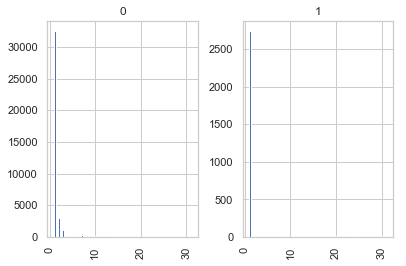

In [63]:
booking_diff.hist(column='day', by='Car_Cancellation', bins=100);

###  Generally people tend to cancel their booking 1-2 days prior to their trip's start date which is not unusual.

## User with most rides

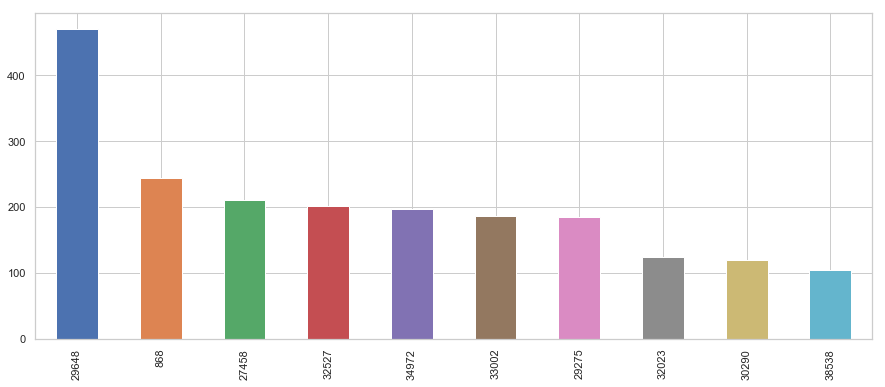

In [64]:
user=train['user_id'].value_counts().head(10)
user.plot.bar(figsize=(15,6))

### User ID with 29468 takes the most rides.

## User with most   Percentage Cancelled rides

In [65]:
user_c=train.groupby(['user_id','Car_Cancellation']).size().unstack(1)
user_c.head()

Car_Cancellation,0,1
user_id,,
16,2.0,1.0
21,1.0,NaN
24,1.0,NaN
35,4.0,NaN
36,1.0,NaN


In [66]:
user_c['cancel_percent']=(user_c[1]/(user_c[1]+user_c[0]))*100
user_c.cancel_percent.sort_values(ascending=False)

user_id
47828    80.952381
43678    75.000000
43107    75.000000
46391    75.000000
42323    75.000000
30607    66.666667
27745    66.666667
34471    66.666667
45954    66.666667
45259    66.666667
44458    66.666667
20695    66.666667
29685    66.666667
40643    66.666667
29895    66.666667
42924    66.666667
43865    66.666667
39992    66.666667
47536    66.666667
7528     66.666667
42298    66.666667
39980    66.666667
38446    66.666667
31698    66.666667
28520    66.666667
31703    66.666667
45058    66.666667
25114    66.666667
23256    66.666667
32215    60.000000
           ...    
48690          NaN
48691          NaN
48692          NaN
48693          NaN
48694          NaN
48696          NaN
48697          NaN
48699          NaN
48700          NaN
48701          NaN
48702          NaN
48703          NaN
48704          NaN
48705          NaN
48706          NaN
48707          NaN
48709          NaN
48710          NaN
48711          NaN
48714          NaN
48718          NaN
4871

# Conclusions-

#### 1.Prices should be increased in the areas with maximum rush due to bad weather, office rush hour, and special events to help ensure that those who need a ride can get one.Some riders will choose to pay, while some will choose to wait a few minutes until prices lower again which will cater the needs.Such increased price is called surge pricing.

#### 2.Number of cancelled rides could be because of no supply (waiting too long, cabs far away).

#### 3.User with maximum cancellation percentage should be taken care off and must be given less priority and bad ratings.

#### 4.The areas between which we have very less bookings or high cancelltion chances  due to village area or low profit can be taken care off by giving some promotions vouchers to boost up demand.

#### 5.Most demand is during weekends and in office hours on weekdays.

#### 6.Most type of travel is point to point, least is rental.

#### 7.We can get more cabs to do point to point and less on rental.